# EDA (Análisis Exploratorio de Datos)

## Introducción:

<div style="text-align: center;">
    <img src="Transito.jpg" alt="Texto alternativo" style="width:500px; height:200px;">
</div>


Nuestro ámbito a investigar es el de los siniestros viales, también conocidos como accidentes de tráfico o accidentes de tránsito. Eventos que involucran vehículos en las vías públicas y que pueden tener diversas causas, como colisiones entre automóviles, motocicletas, bicicletas o peatones, atropellos, choques con objetos fijos o caídas de vehículos. Estos incidentes pueden tener consecuencias que van desde daños materiales hasta lesiones graves o fatales para los involucrados.

El contexto en el que nos encontramos es la Ciudad Autonoma de Buenos aires donde los siniestros viales son una preocupación importante debido al alto volumen de tráfico y la densidad poblacional. Estos incidentes pueden tener un impacto significativo en la seguridad de los residentes y visitantes de la ciudad, así como en la infraestructura vial y los servicios de emergencia.

Las tasas de mortalidad relacionadas con siniestros viales suelen ser un indicador crítico de la seguridad vial en una región. Estas tasas se calculan, generalmente, como el número de muertes por cada cierto número de habitantes o por cada cierta cantidad de vehículos registrados. Reducir estas tasas es un objetivo clave para mejorar la seguridad vial y proteger la vida de las personas en la ciudad.

**El seguimiento de las estadísticas y la implementación de políticas efectivas son esenciales para abordar este problema de manera adecuada.**

A continuación realizaremos la búsqueda de valores faltantes, valores atípicos/extremos u outliers y registros duplicados. Asimismo, la utilización de gráficos coherentes según la tipología de variable que corresponda resulta esencial para ir contemplando un panorama general de los datos de análisis.

In [2]:
#importamos las librearías que vamos a utilizar
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
from ydata_profiling import ProfileReport
import warnings

In [3]:
#Dataset cargado para lectura
ruta_hechos = "C:\\Users\\licle\\Desktop\\PROYECTO INDIVIDUAL N°2\\Hechos.csv"
ruta_victimas = "C:\\Users\\licle\\Desktop\\PROYECTO INDIVIDUAL N°2\\Victimas.csv"

hechos = pd.read_csv(ruta_hechos)
victimas = pd.read_csv(ruta_victimas)

# Hechos 

* Vamos a realizar algunas lineas de código para ir revisando que nos pueden mostrar las diferentes columnas y variables:

In [4]:
hechos.head()

,ID,N_VICTIMAS,FECHA,AAAA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,Calle,COMUNA,pos x,pos y,VICTIMA,ACUSADO
0,2016-0001,1,1/1/2016,2016,4,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,PIEDRA BUENA AV.,8,-58.47533969,-34.68757022,MOTO,AUTO
1,2016-0002,1,1/2/2016,2016,1,AV GRAL PAZ Y AV DE LOS CORRALES,GRAL PAZ,"PAZ, GRAL. AV.",9,-58.50877521,-34.66977709,AUTO,PASAJEROS
2,2016-0003,1,1/3/2016,2016,7,AV ENTRE RIOS 2034,AVENIDA,ENTRE RIOS AV.,1,-58.39040293,-34.63189362,MOTO,AUTO
3,2016-0004,1,1/10/2016,2016,0,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,AVENIDA,LARRAZABAL AV.,8,-58.46503904,-34.68092974,MOTO,SD
4,2016-0005,1,1/21/2016,2016,5,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,AVENIDA,SAN JUAN AV.,1,-58.38718297,-34.62246630,MOTO,PASAJEROS


In [5]:
hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   ID               696 non-null    object
 1   N_VICTIMAS       696 non-null    int64 
 2   FECHA            696 non-null    object
 3   AAAA             696 non-null    int64 
 4   HH               696 non-null    object
 5   LUGAR_DEL_HECHO  696 non-null    object
 6   TIPO_DE_CALLE    696 non-null    object
 7   Calle            695 non-null    object
 8   COMUNA           696 non-null    int64 
 9   pos x            696 non-null    object
 10  pos y            696 non-null    object
 11  VICTIMA          696 non-null    object
 12  ACUSADO          696 non-null    object
dtypes: int64(3), object(10)
memory usage: 70.8+ KB


* Tenemos varias columnas con variables categóricas, gráficaremos según columnas para ver como se comportan las variables:

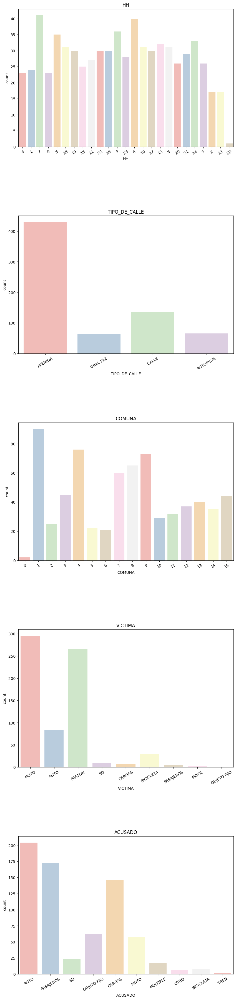

In [6]:
#renombramos la columna calle para tener normalizados todos los titulos de las columnas en mayúsculas
hechos.rename(columns={'Calle': 'CALLE'}, inplace=True)

#Graficar subniveles de cada variable categórica
cols_cat = ["HH", "TIPO_DE_CALLE","COMUNA","VICTIMA","ACUSADO"]

#Filtramos mensajes de advertencias para que nuestro resultado sea más prólijo
warnings.filterwarnings("ignore")

#Gráficos de barras de conteo
fig, ax = plt.subplots(nrows=len(cols_cat),ncols =1, figsize=(10,45))
fig.subplots_adjust(hspace=0.5)

for i, col in enumerate(cols_cat):
    sns.countplot(x=col, data=hechos,ax=ax[i], palette='Pastel1')
    ax[i].set_title(col)
    ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation=30)

* Borramos la comuna 0 que es un valor inexistente, además que no aporta mucha información su filas

In [ ]:
hechos.loc[hechos['COMUNA'] == 0]

In [ ]:
#borramos
indices_a_eliminar = hechos.loc[hechos['COMUNA'] == 0].index

# Eliminar estas filas usando drop con inplace=True
hechos.drop(indices_a_eliminar, inplace=True)

* En una revisión anterior advertimos que fechas y calles son columnas con un amplia diversidad de varibles que se repiten poco, vamos a gráficar según las 25 variables más frecuentes para ver si exiten tendencias:

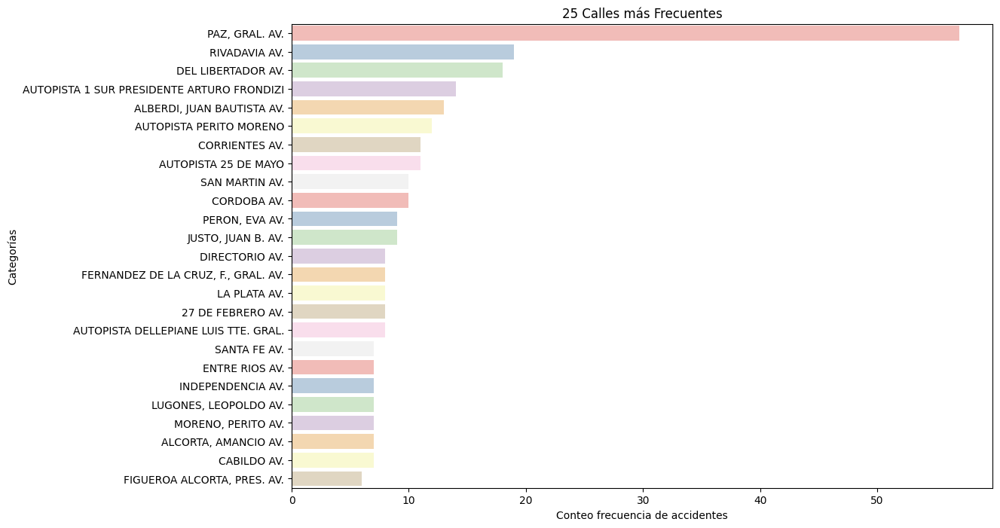

In [7]:
#Cómo calles y fechas tiene una diversidad de variables la reducimos a las primeras 25 más frecuentes para eso contamos las variables más repetidas y gráficamos
warnings.filterwarnings("ignore")

# Contar las Calles 
categoria_counts = hechos['CALLE'].value_counts()

# Seleccionar las 25 Calles más frecuentes
top_25_categorias = categoria_counts.head(25)

# Graficar las 25 categorías más frecuentes
plt.figure(figsize=(12, 8))
sns.barplot(x=top_25_categorias.values, y=top_25_categorias.index, palette='Pastel1')
plt.xlabel('Conteo frecuencia de accidentes')
plt.ylabel('Categorías')
plt.title('25 Calles más Frecuentes')
plt.show()

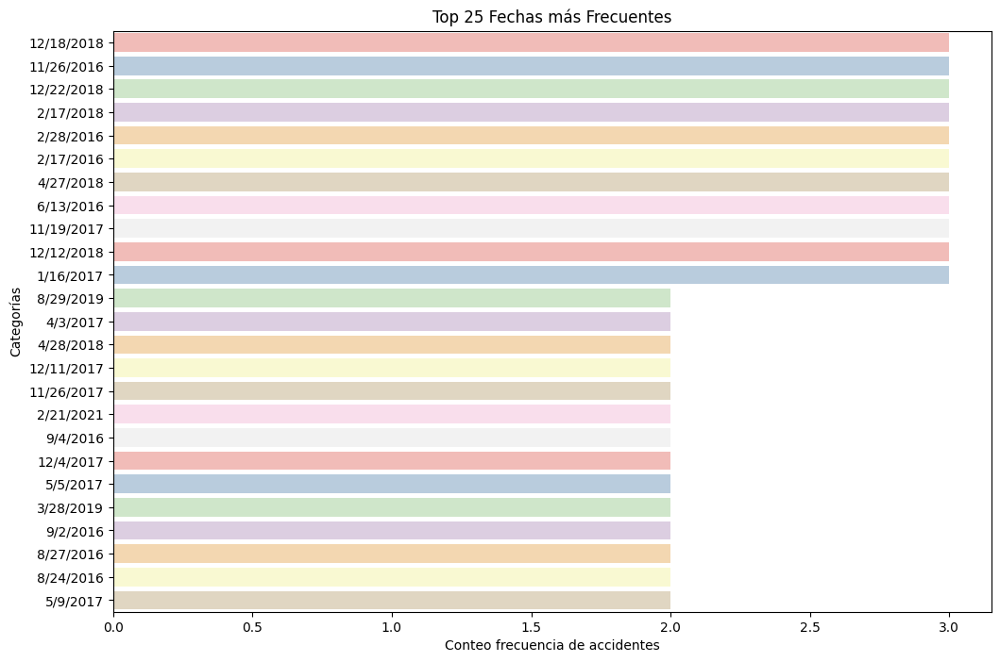

In [8]:
#Cómo calles y fechas tiene una diversidad de variables la reducimos a las primeras 25 más frecuentes para ello contamos las variables más repetidas y gráficamos
warnings.filterwarnings("ignore")

# Contar las Fechas 
categoria_counts = hechos['FECHA'].value_counts()

# Seleccionar las 25 Calles más frecuentes
top_25_categorias = categoria_counts.head(25)

# Graficar las 25 categorías más frecuentes
plt.figure(figsize=(12, 8))
sns.barplot(x=top_25_categorias.values, y=top_25_categorias.index,palette='Pastel1')
plt.xlabel('Conteo frecuencia de accidentes')
plt.ylabel('Categorías')
plt.title('Top 25 Fechas más Frecuentes')
plt.show()

* Ya recorrimos las variables categóricas, ahora hagamos lo mismo con las variables númericas:

In [9]:
#Vemos como se comportan las variables númericas
hechos.describe()

,N_VICTIMAS,AAAA,COMUNA
count,696.000000,696.000000,696.000000
mean,1.030172,2018.188218,7.425287
std,0.179393,1.683754,4.387050
min,1.000000,2016.000000,0.000000
25%,1.000000,2017.000000,4.000000
50%,1.000000,2018.000000,8.000000
75%,1.000000,2020.000000,11.000000
max,3.000000,2021.000000,15.000000


In [10]:
#Convertimos el tipo de dato de las variables float a enteros, para mayor facilidad y legibilidad en los gráficos  
hechos["AAAA"] = hechos["AAAA"].astype(int)
hechos["N_VICTIMAS"] = hechos["N_VICTIMAS"].astype(int)
hechos["COMUNA"] = hechos["COMUNA"].astype(int)

In [11]:
#Verificamos si hay valores repetidos en ID
conteo_ID_rep = hechos['ID'].value_counts()
print(conteo_ID_rep)
#No hay valores repetidos

ID
2016-0001    1
2019-0050    1
2019-0042    1
2019-0043    1
2019-0044    1
            ..
2017-0111    1
2017-0112    1
2017-0113    1
2017-0114    1
2021-0097    1
Name: count, Length: 696, dtype: int64


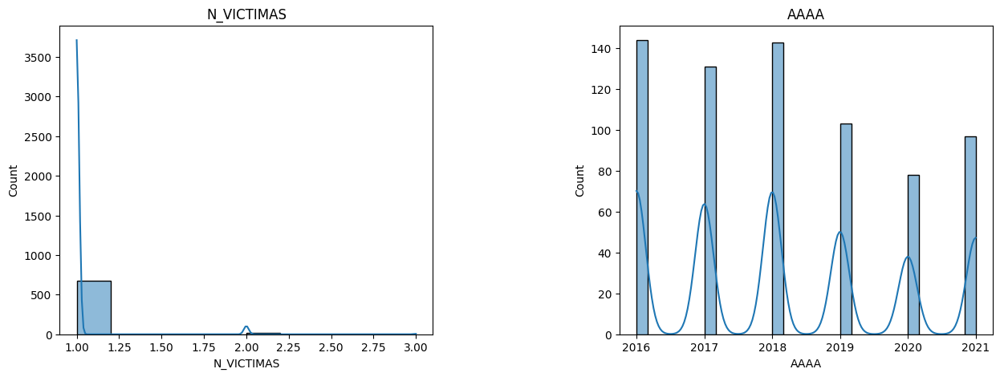

In [12]:
#Mejor es gráficar las variables númericas para detectar algún comportamiento:

#Gráficamos un histograma
col_num = ["N_VICTIMAS","AAAA"]

fig, ax= plt.subplots(nrows=1,ncols=len(col_num),figsize=(15,5))
fig.subplots_adjust(hspace=1, wspace=0.5)

for i, col in enumerate(col_num):
    if col == "N_VICTIMAS":
        nbins = 10
    elif col =="AAAA":
        nbins = 30
    else:
        nbins = 50
    sns.histplot(data=hechos,x=col, ax=ax[i], bins= nbins, kde=True, kde_kws={'bw_adjust': 0.3})
    ax[i].set_title(col)

## Conclusiones

* Tenemos 9 columnas que nos interesa investigar y ahondar:
    * Variables categóricas:
        * "HH" : Si bien es un número, al no hacer operaciones númericas, entendemos la variable con un tipo categórico. Podemos ver que hay un tendencia marcada que se centra entre las 5, 6 y 7 AM., luego se percibe cierta estabilidad en la frecuencia. Los horarios vespertinos tienen generalmente un encuentro con la gente que visita eventos donde se consume alcohol y tiene un encuentro con gente que asiste al trabajo en horario matutino.
        * "TIPO_DE_CALLE" : Las mayoría de los hechos ocurren con una tendencia en las avenidas, es un dato interesante que tendrémos en cuenta a la hora de revisar los KPI´s.
        * "COMUNA" : Si bien es un número, al no hacer operaciones númericas, entendemos la variable con un tipo categórico. Las zonas más recurrentes de victimas están en la zona de Microcentro (comuna 1) y alrededores como por ejemplo La Boca (comuna 4)
        * "VICTIMA" : Hay una clara tendencia en que las principales victimas son las Motos, lo cual resulta un dato interesante en nuestra investigación, las motocicletas suelen ser mucho más vulnerables a la hora de un accidente que otros vehículos.
        * "ACUSADO" : Nuevamente encabezan las Motos siendo coherente con el análisis anterior dado que la frecuencia de las motos es la mayor victima de accidentes de tránsito. Le siguen los pasajeros.
        * "FECHA" : No encontramos mucha información en la tendencia y conteo en las fechas, podemos anticipar cuales fueron los años con mayores accidentes, estos son 2016, 2017 y 2018.
        * "CALLE" : Las calles más recurrentes son Avenidas, la Av. Gral Paz, Av. Rivadavía y Av. Libertador, lo cual es coherente dado que son arterias fundamentales que cruzan varios barrios porteños y dado que son avenidas son las más frecuentes a la hora de los accidentes.
    * Variables númericas: 
        * "N_VICTIMAS" : No podemos percibir gran cantidad de información, el mín es el que más se repite el cual es 1 y el max es 3 con menor frecuencia.
        * "AAAA" : Los años con más registros de victimas son 2016, 2017 y 2018, teniendo un pico en 2018. Luego se ve una baja, lo cual podemos percibir que se realizó algún tipo de campaña de concientización dado a la baja, que luego vemos hacia 2021 empieza a alzarse.


# Victimas
* Realizamos el mismo formato de análisis que tuvimos con el DataSet de 'hechos', adaptandonos a la naturaleza de los datos que encontramos en victimas. Una vez Finalizamos el recorrido por variables categóricas y númericas pasamos a las conclusiones: 

In [13]:
victimas.head()

,ID_hecho,FECHA,ROL,SEXO,EDAD,FECHA_FALLECIMIENTO
0,2016-0001,1/1/2016,CONDUCTOR,MASCULINO,19.0,1/1/2016
1,2016-0002,1/2/2016,CONDUCTOR,MASCULINO,70.0,1/2/2016
2,2016-0003,1/3/2016,CONDUCTOR,MASCULINO,30.0,1/3/2016
3,2016-0004,1/10/2016,CONDUCTOR,MASCULINO,18.0,SD
4,2016-0005,1/21/2016,CONDUCTOR,MASCULINO,29.0,2/1/2016


In [14]:
victimas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID_hecho             717 non-null    object 
 1   FECHA                717 non-null    object 
 2   ROL                  717 non-null    object 
 3   SEXO                 717 non-null    object 
 4   EDAD                 664 non-null    float64
 5   FECHA_FALLECIMIENTO  717 non-null    object 
dtypes: float64(1), object(5)
memory usage: 33.7+ KB


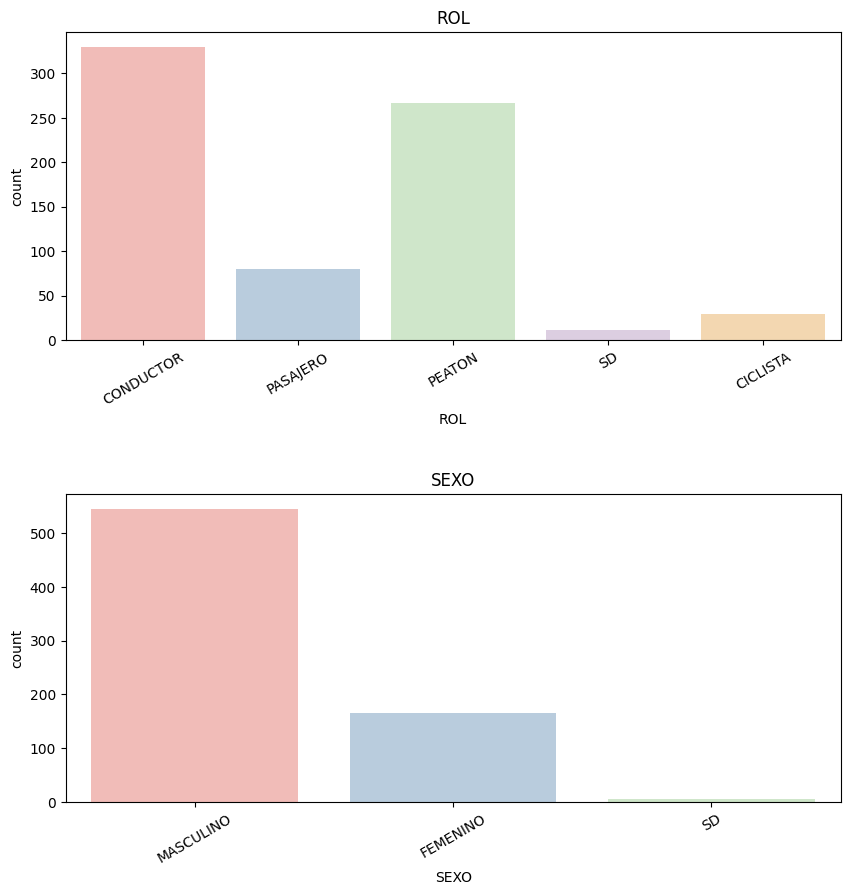

In [15]:
warnings.filterwarnings("ignore")

#Graficar subniveles de cada variable categórica
cols_cat = ["ROL", "SEXO"]

#Gráficos de barras de conteo
fig, ax = plt.subplots(nrows=len(cols_cat),ncols =1, figsize=(10,10))
fig.subplots_adjust(hspace=0.5)

for i, col in enumerate(cols_cat):
    sns.countplot(x=col, data=victimas,ax=ax[i], palette='Pastel1')
    ax[i].set_title(col)
    ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation=30)

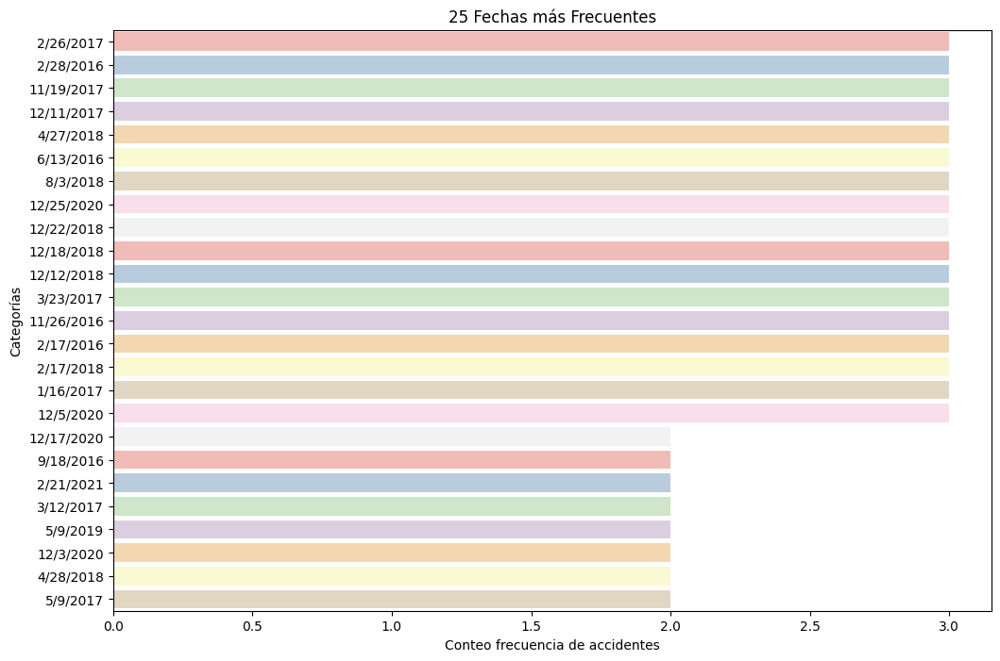

In [16]:
#Cómo Fechas y Fechas de fallecimiento tiene una diversidad de variables la reducimos a las primeras 25 más frecuentes para eso contamos las variables más repetidas y gráficamos
warnings.filterwarnings("ignore")

# Contar las Fechas 
categoria_counts = victimas['FECHA'].value_counts()

# Seleccionar las 25 Calles más frecuentes
top_25_categorias = categoria_counts.head(25)

# Graficar las 25 categorías más frecuentes
plt.figure(figsize=(12, 8))
sns.barplot(x=top_25_categorias.values, y=top_25_categorias.index, palette='Pastel1')
plt.xlabel('Conteo frecuencia de accidentes')
plt.ylabel('Categorías')
plt.title('25 Fechas más Frecuentes')
plt.show()

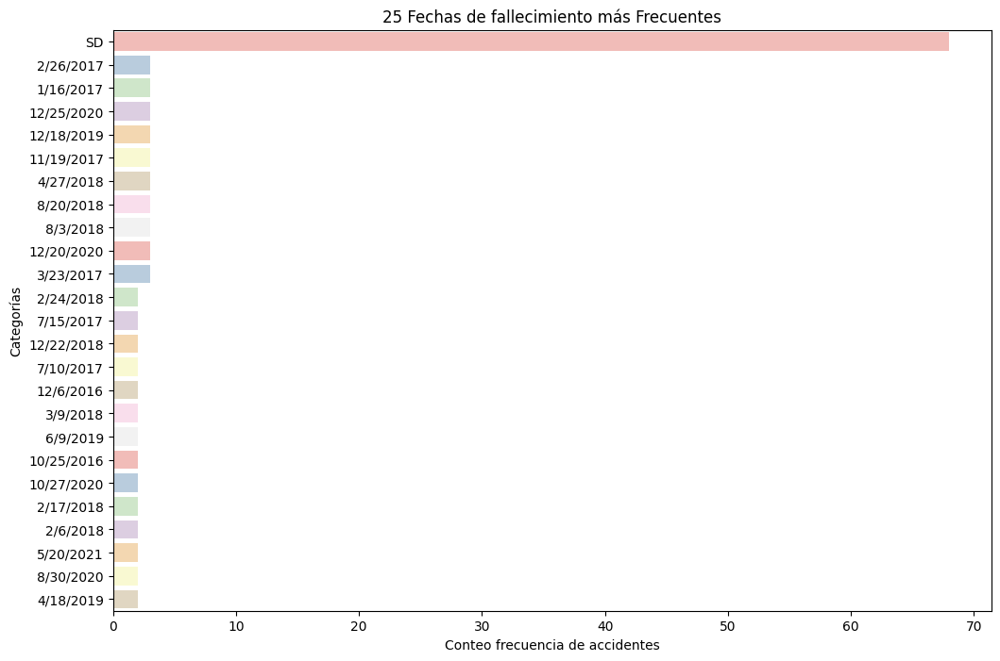

In [17]:
#Cómo Fechas y Fechas de fallecimiento tiene una diversidad de variables la reducimos a las primeras 25 más frecuentes para eso contamos las variables más repetidas y gráficamos
warnings.filterwarnings("ignore")

# Contar las Fechas 
categoria_counts = victimas['FECHA_FALLECIMIENTO'].value_counts()

# Seleccionar las 25 Calles más frecuentes
top_25_categorias = categoria_counts.head(25)

# Graficar las 25 categorías más frecuentes
plt.figure(figsize=(12, 8))
sns.barplot(x=top_25_categorias.values, y=top_25_categorias.index, palette='Pastel1')
plt.xlabel('Conteo frecuencia de accidentes')
plt.ylabel('Categorías')
plt.title('25 Fechas de fallecimiento más Frecuentes')
plt.show()

In [18]:
#Vemos como se comporta la variable númerica
victimas.describe()

,EDAD
count,664.000000
mean,42.167169
std,19.788034
min,1.000000
25%,27.000000
50%,37.000000
75%,56.250000
max,95.000000


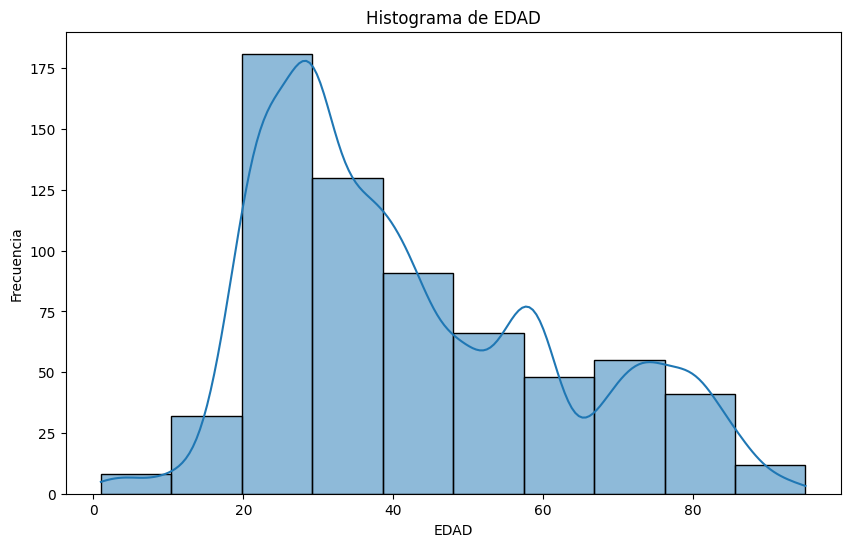

In [19]:
#Mejor es gráficas las variables númericas para detectar algún comportamiento:

#Gráficamos 
# Seleccionar la columna
col = 'EDAD'

# Definir el número de bins
nbins = 10  # Puedes ajustar este valor según tu preferencia

# Graficar el histograma con KDE
plt.figure(figsize=(10, 6))
sns.histplot(data=victimas, x=col, bins=nbins, kde=True, kde_kws={'bw_adjust': 0.5})
plt.title(f'Histograma de {col}')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

Revisamos cómo se comportan las variables ID_hecho, sospechamos que se repiten cuando hay un hecho y existen varias victimas en ese hecho.

In [20]:
#Verificamos si hay valores repetidos en ID
conteo_ID_rep = victimas['ID_hecho'].value_counts()
print(conteo_ID_rep)


ID_hecho
2017-0035    3
2017-0050    2
2016-0041    2
2018-0015    2
2020-0063    2
            ..
2017-0115    1
2017-0116    1
2017-0118    1
2017-0120    1
2021-0096    1
Name: count, Length: 696, dtype: int64


In [21]:
hechos[hechos["ID"]== "2017-0035"]

,ID,N_VICTIMAS,FECHA,AAAA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,CALLE,COMUNA,pos x,pos y,VICTIMA,ACUSADO
170,2017-0035,3,3/23/2017,2017,5,AV. DR. TRISTAN ACHAVAL RODRIGUEZ Y BLVD. AZUC...,AVENIDA,"ACHAVAL RODRIGUEZ, T., DR. AV.",1,-58.35881506,-34.61113641,AUTO,OBJETO FIJO


In [22]:
hechos[hechos["ID"]== "2017-0050"]

,ID,N_VICTIMAS,FECHA,AAAA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,CALLE,COMUNA,pos x,pos y,VICTIMA,ACUSADO
180,2017-0050,2,4/28/2017,2017,11,AU PERITO MORENO Y RAMAL ENLACE AU1/AU6,AUTOPISTA,AUTOPISTA PERITO MORENO,9,.,.,MOTO,CARGAS


Con la busqueda de variables verificamos que las veces que se repite el valor ID_hecho es según la cantidad de victimas del hecho

## Conclusiones

* Tenemos 6 columnas que nos interesa investigar y ahondar:
    * Variables categóricas:
        * "ID_hecho" : como mencionamos anteriormente, se repite cuando existió un hecho y hubo varios perjudicados.
        * "ROL" : En el conteo de las diferentes variables que hay, la tendencia está puesta en Conductor y Peaton.
        * "SEXO" : en los casos predomina el género masculino que el femenino.
        * "FECHA" : No encontramos mucha información en la tendencia y conteo en las fechas. Se puede comparar con el DataFrame de hechos y revisamos mismas tendencias.
        * "FECHA_FALLECIMIENTO" : Tenemos la variable SD que bien podría ser faltante de datos, como también que la persona no registra una muerte. Por lo demás no se registra mayor información.
    * Variables númericas: 
        * "EDAD" : Hay una tendencia bien marcada en la edad, se registra una tendencia bien marcada entre los 20 y 40 años con un sesgo hacia la derecha.

## Análisis bivariable 

Cómo notamos que hay cierta correlación entre SEXO y EDAD, vamos a gráficar según ambas columnas 

* EDAD y SEXO:

    * Vemos una posible relación dado a que hay una mayor proporción de varones frente a mujeres y en la edad entre 20 y 40 años:

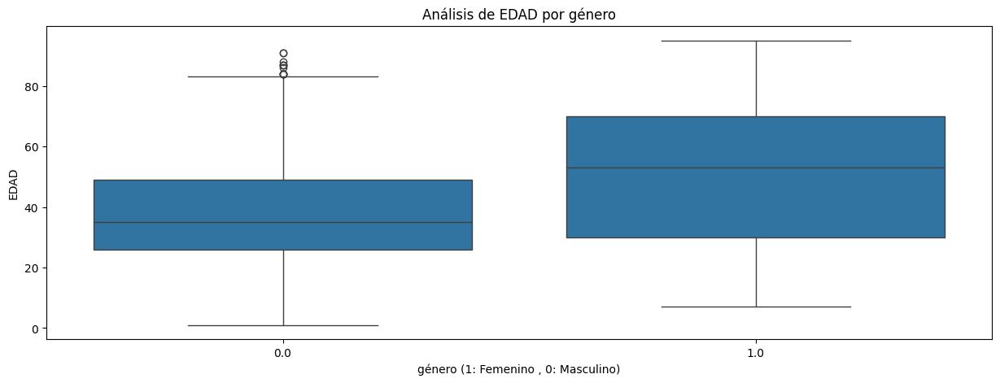

In [23]:
#Realizamos un gráfico de Cajas para revisar si hay alguna correlación entre edad y género para ello, 
#haremos un diccionario binario para las variables de género y lo aplicamos a las edades.
warnings.filterwarnings("ignore")


#mapeamos un diccionario en una nueva columna binaria según género
dicc = {'FEMENINO':1, 'MASCULINO':0 }
bin = victimas['SEXO'].map(dicc)
victimas['gen_bin'] = bin


# Creación del gráfico de cajas
fig, ax = plt.subplots(figsize=(15, 5))

# Creación del boxplot
sns.boxplot(x='gen_bin', y=col, data=victimas, ax=ax)
ax.set_xlabel('género (1: Femenino , 0: Masculino)')
ax.set_title(f'Análisis de {col} por género')

# Mostramos el gráfico
plt.show()

se observa que hay cierta correlación entre NÚMERO DE VICTIMAS y AÑOS, vamos a gráficar según ambas columnas 

* Victimas según cada años (gráfico de barras):

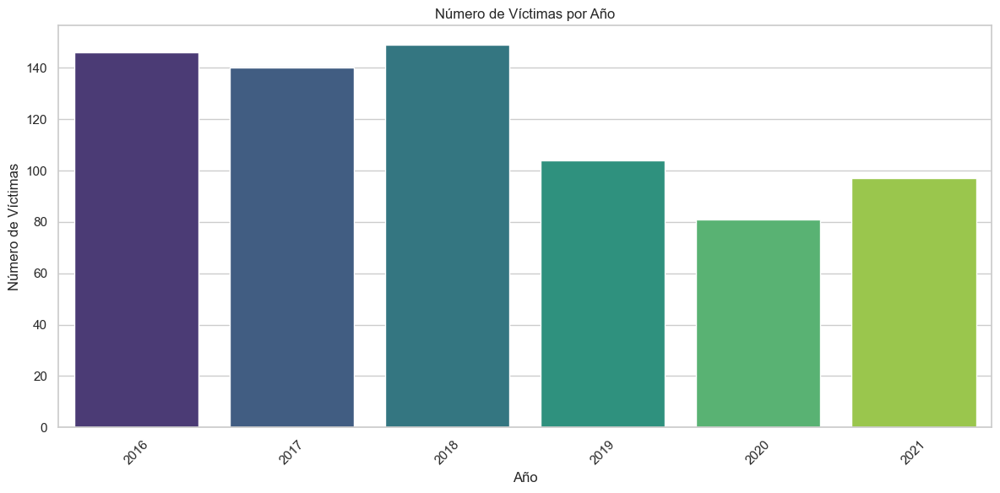

In [24]:
warnings.filterwarnings("ignore")

#Vamos a gráficar unos esquemas según años:

# Convertir la columna FECHA a tipo datetime en ambos DataSets
victimas['FECHA'] = pd.to_datetime(victimas['FECHA'], errors='coerce')
hechos['FECHA'] = pd.to_datetime(hechos['FECHA'], errors='coerce')

# Extraer el año de la columna FECHA en victimas
victimas['AAAA'] = victimas['FECHA'].dt.year

# Contar el número de víctimas por año
victimas_por_ano = victimas.groupby('AAAA').size().reset_index(name='N_VICTIMAS')

# Configuración del estilo de los gráficos
sns.set(style="whitegrid")

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
sns.barplot(x='AAAA', y='N_VICTIMAS', data=victimas_por_ano, palette='viridis')

# Ajustes del gráfico
plt.xlabel('Año')
plt.ylabel('Número de Víctimas')
plt.title('Número de Víctimas por Año')
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

* Números de victimas según mes por años (Gráfico lineal):

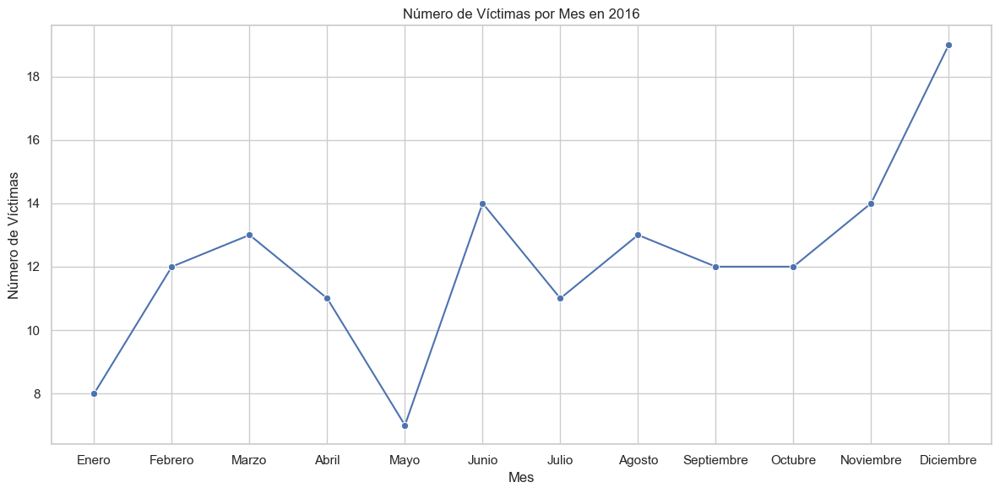

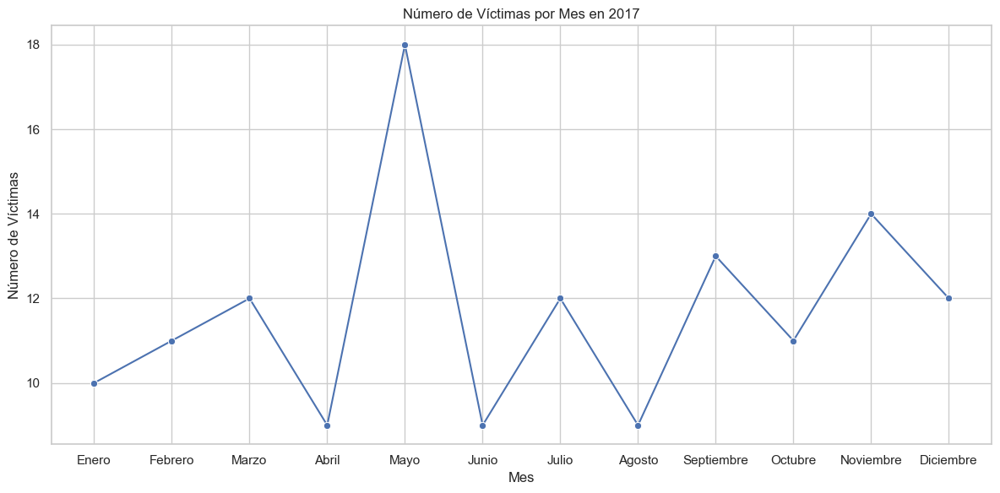

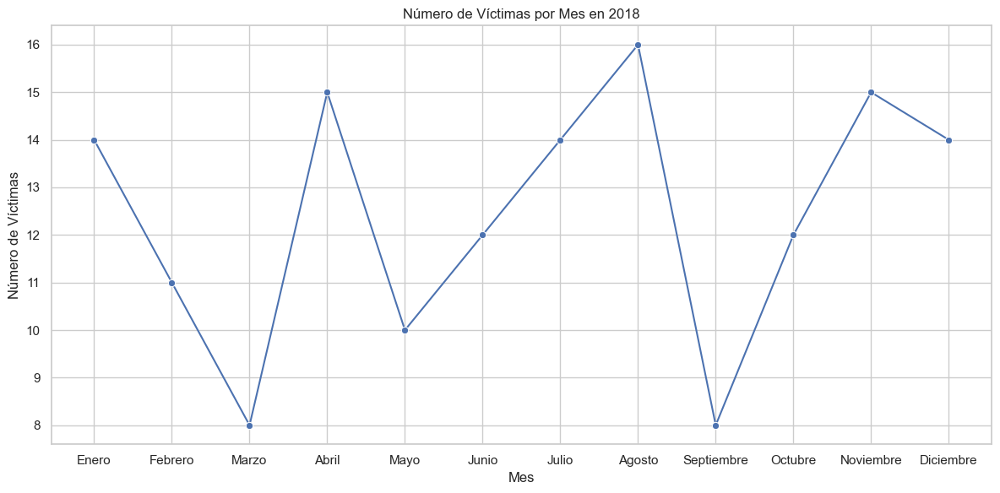

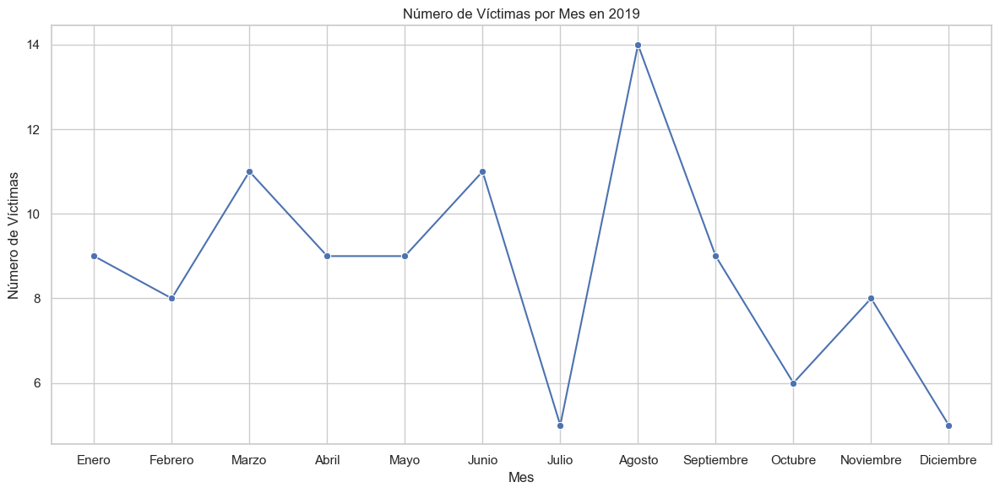

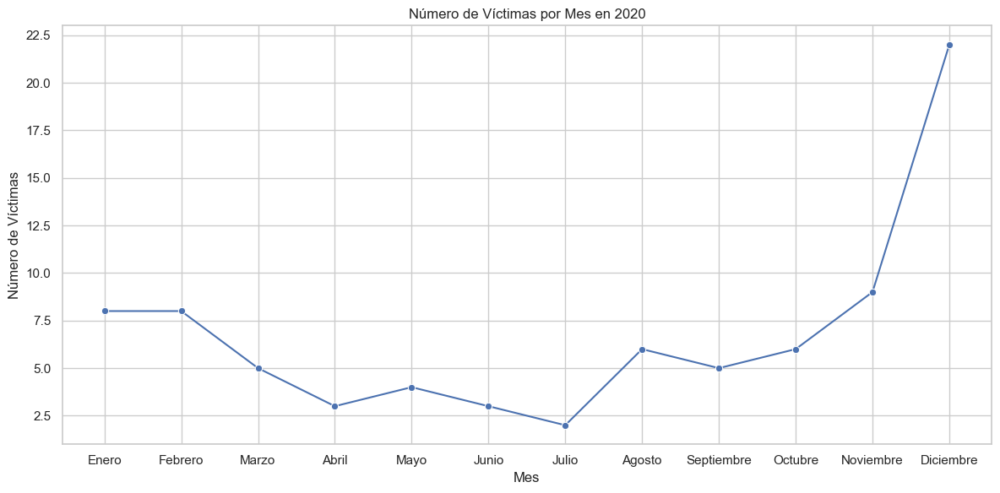

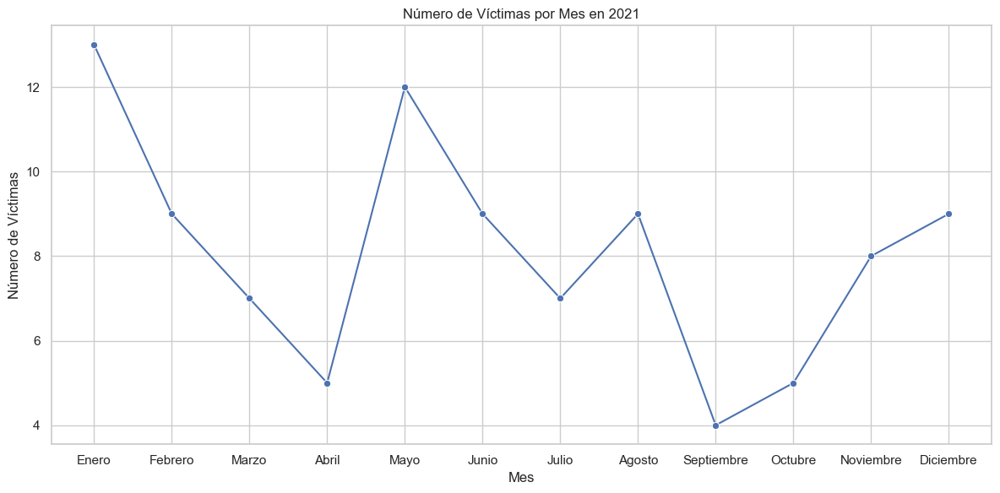

In [25]:
# Extraer el mes de la columna FECHA en victimas
victimas['MES'] = victimas['FECHA'].dt.month

# Contar el número de víctimas por mes
victimas_por_mes = victimas.groupby(['AAAA', 'MES']).size().reset_index(name='N_VICTIMAS')

# años únicos
anios_unicos = victimas_por_mes['AAAA'].unique()

# Configuración del estilo
sns.set(style="whitegrid")

# Crear gráficos separados para cada año
for anio in anios_unicos:
    plt.figure(figsize=(12, 6))
    data_anio = victimas_por_mes[victimas_por_mes['AAAA'] == anio]
    sns.lineplot(data=data_anio, x='MES', y='N_VICTIMAS', marker='o')

    # Ajustes del gráfico
    plt.xlabel('Mes')
    plt.ylabel('Número de Víctimas')
    plt.title(f'Número de Víctimas por Mes en {anio}')
    plt.xticks(ticks=range(1, 13), labels=[
        'Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio',
        'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre'
    ])
    plt.tight_layout()

    # Mostrar el gráfico
    plt.show()

* Número de fallecimiento por mes según años:

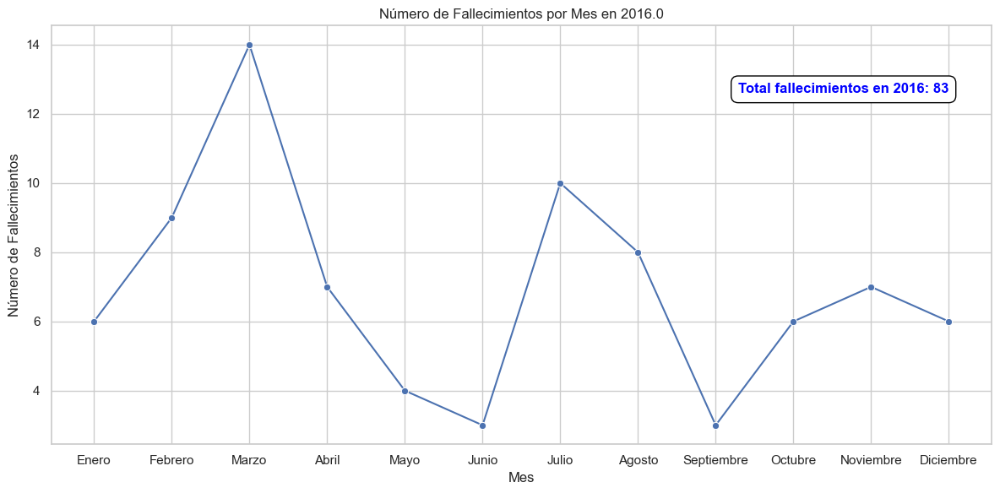

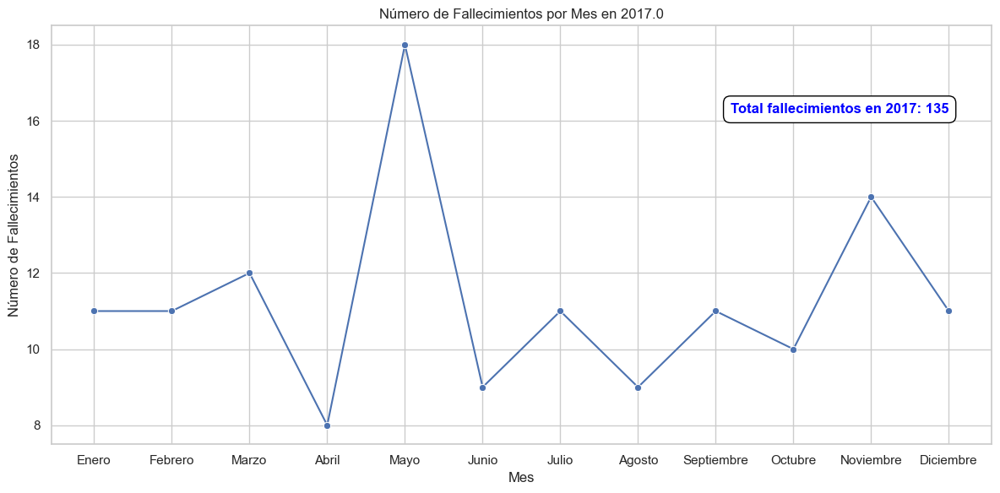

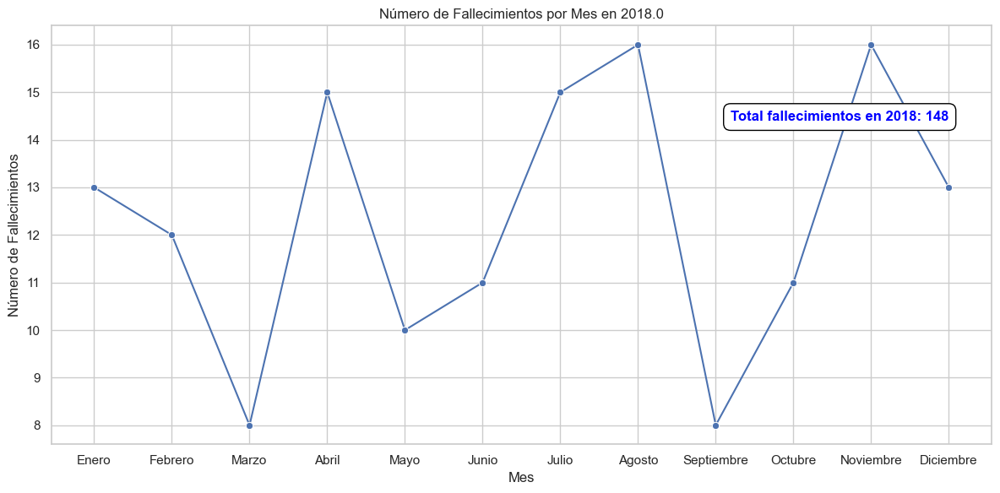

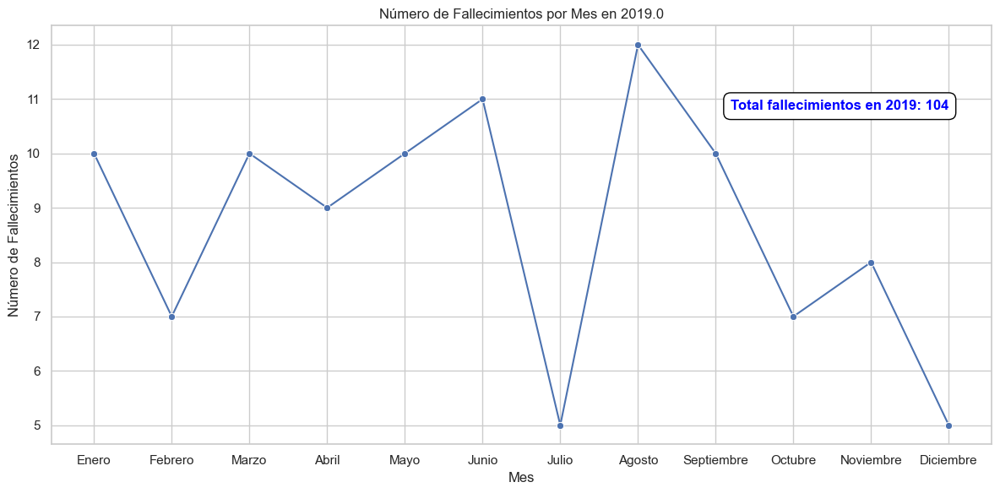

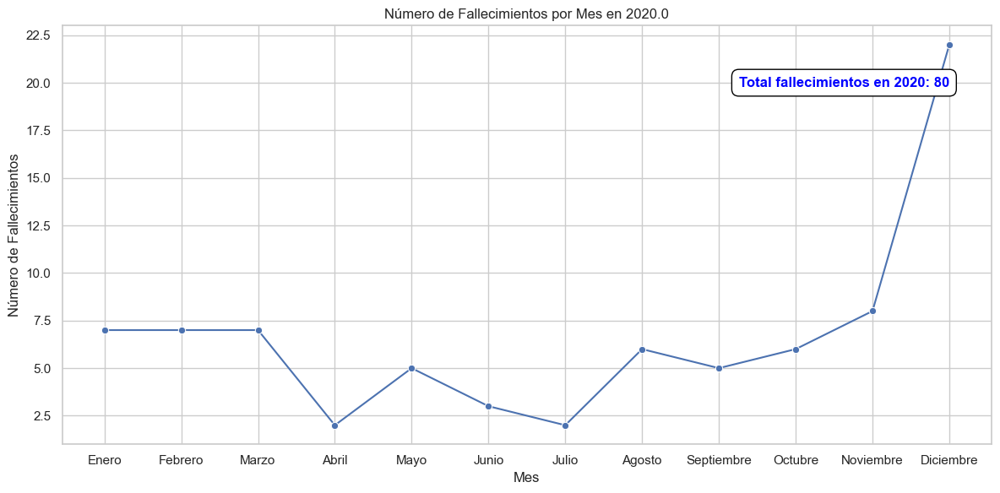

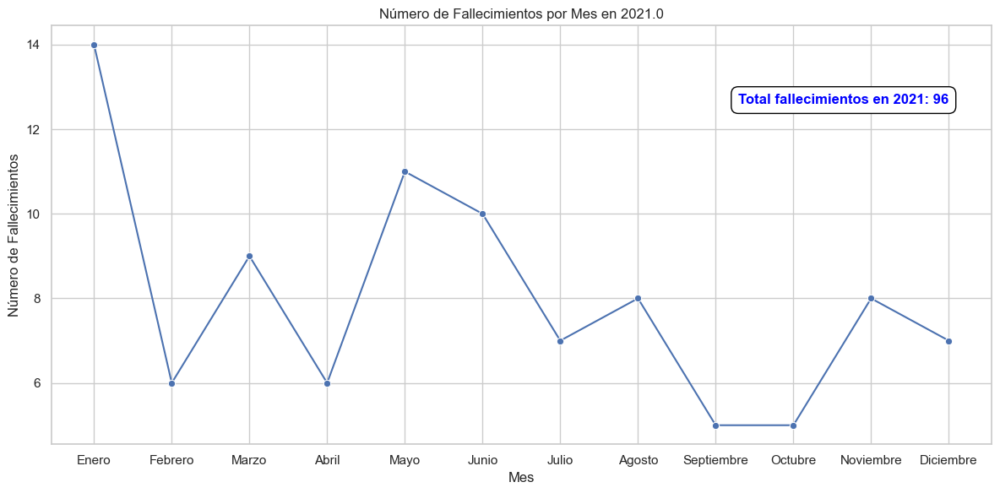

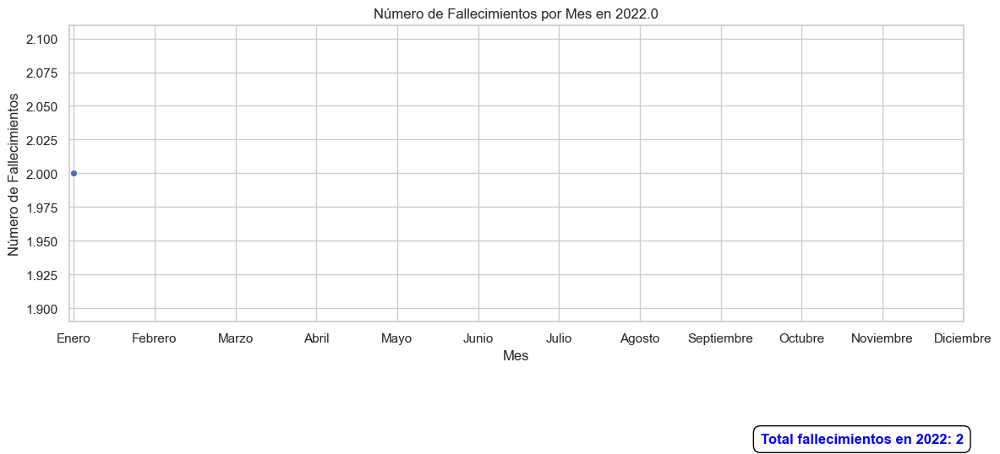

Accidentes con fallecimiento: 648
Accidentes sin fallecimiento: 69


In [26]:
# Convertimos la columna FECHA_FALLECIMIENTO a tipo datetime
victimas['FECHA_FALLECIMIENTO'] = pd.to_datetime(victimas['FECHA_FALLECIMIENTO'], errors='coerce')

# Reemplazamos "SD" por NaN en la columna FECHA_FALLECIMIENTO para poder manejar los valores faltantes
victimas['FECHA_FALLECIMIENTO'].replace('SD', pd.NaT, inplace=True)

# Extraemos el año y el mes de la columna FECHA_FALLECIMIENTO
victimas['AÑO_FALLECIMIENTO'] = victimas['FECHA_FALLECIMIENTO'].dt.year
victimas['MES_FALLECIMIENTO'] = victimas['FECHA_FALLECIMIENTO'].dt.month

# Filtramos filas con fechas de fallecimiento válidas
victimas_fallecidas = victimas.dropna(subset=['AÑO_FALLECIMIENTO', 'MES_FALLECIMIENTO'])

# Contamos el número de víctimas por mes y año de fallecimiento
fallecimientos_por_mes = victimas_fallecidas.groupby(['AÑO_FALLECIMIENTO', 'MES_FALLECIMIENTO']).size().reset_index(name='N_FALLECIMIENTOS')

# Obtener los años únicos de fallecimiento
anios_fallecimiento_unicos = fallecimientos_por_mes['AÑO_FALLECIMIENTO'].unique()

# Configuración del estilo del gráfico
sns.set(style="whitegrid")

# Gráficos según años:
for anio in anios_fallecimiento_unicos:
    plt.figure(figsize=(12, 6))
    data_anio_fallecimiento = fallecimientos_por_mes[fallecimientos_por_mes['AÑO_FALLECIMIENTO'] == anio]
    sns.lineplot(data=data_anio_fallecimiento, x='MES_FALLECIMIENTO', y='N_FALLECIMIENTOS', marker='o')

    # Carácteristicas 
    plt.xlabel('Mes')
    plt.ylabel('Número de Fallecimientos')
    plt.title(f'Número de Fallecimientos por Mes en {anio}')
    plt.xticks(ticks=range(1, 13), labels=[
        'Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio',
        'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre'
    ])

    # Calcular el total de accidentes con fallecimientos para el año actual
    total_fallecimientos_anio = data_anio_fallecimiento['N_FALLECIMIENTOS'].sum()
    
    # Agregar el texto del total en el gráfico con un recuadro
    plt.text(
        12, max(data_anio_fallecimiento['N_FALLECIMIENTOS']) * 0.9,
        f'Total fallecimientos en {int(anio)}: {total_fallecimientos_anio}',
        horizontalalignment='right', fontsize=12, color='blue', weight='bold',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5')
    )
    
    plt.tight_layout()
    plt.show()

# Contar el número de accidentes con y sin fallecimiento
accidentes_con_fallecimiento = victimas_fallecidas.shape[0]
accidentes_sin_fallecimiento = victimas[victimas['FECHA_FALLECIMIENTO'].isna()].shape[0]

print(f'Accidentes con fallecimiento: {accidentes_con_fallecimiento}')
print(f'Accidentes sin fallecimiento: {accidentes_sin_fallecimiento}')

## Conclusiones

* Analicemos 4 casos de análisis de bivariables:
    * EDAD y SEXO:
        * Hay una concentración de datos de dos tendencias la edad alrededor de los 25 y 45 años en el género másculino. Teniendo una media en los 30 años, por otro lado vemos que el género femenino tiene un margen etario más diverso. Esto nos permite pensar que una tendencia central de accidentes de tránsito se encuentra en hombres jovenes entre 25 y 45 años.
    * VICTIMAS y AÑOS: 
        * Existe un pico de victimas en el año 2018 y una caida al 2019, podríamos arriesgar la hipótesis de que en esos años se ha decido tomar alguna iniciativa para tratar de bajar la tasas de siniestros viales. Probablemente haya sucedido en el 2019 ya que vemos que hacia 2020 decrece el número de perjudicados y vuelve a remontar en el 2021.
    * MESES y VICTIMAS POR AÑOS:
        * No hay un comportamiento sistemático en las variables año a año, no obstante se puede percibir abruptas caidas y subidas de victimas en trimestres puntuales de los años. Estos trimestres van desde Octubre-Novimebre-Diciembre/Marzo-Abril-Mayo/Julio-Agosto-Septiembre. A fines de años tenemos dos acontecimientos importantes bien tradicionales que son las fiestas de fines de año y las vacaciones. En Marzo en adelante tenemos el inicio de las clases. Y en Julio en adelante las vacaciones de invierno. Podemos ensayar una hipótesis según esas fechas de mayor flujo vehícular y en fechas festivas el consumo de sustancias en contextos festivos.
    *  FALLECIMIENTOS y MESES POR AÑOS:
        * Un patrón que notamos es la continuidad en cada año en el mes de enero tiene un registro estandar de victimas fatales de accidentes.
        * En el año 2020 se puede verificar la baja moralidad respecto otros años producto de alguna iniciativa preventiva (sospechamos).
        * En meses puntuales (Mayo 2017 y Agosto 2018) advertimos que exiten picos de accidentes que fueron fatales, dado a la comparación con los gráficos de victimas en donde el accidente y el registro de fallecimiento suceden en el mismo mes. 

# Mapa de calor por zonas y GPS Visualizer

En este apartado vamos a trabajar con la geolocalización de accidentes para tener una noción rápida visual e intuitiva en un mapa de la Ciudad Autonoma de Buenos Aires. Por ello, vamos a gráficar un mapa de calor sobre los lugares con más accidentes y para corroborar la información vamos a gráficar con la página GPS Visualizer los lugares donde hay ocurrido más accidentes. Teniendo en cuenta accidentes por comuna gráficado anteriormente.
* Mapa de calor por zonas:

In [27]:
hechos_cop = hechos.copy()
hechos_cop['pos x'] = pd.to_numeric(hechos_cop['pos x'], errors='coerce')
hechos_cop['pos y'] = pd.to_numeric(hechos_cop['pos y'], errors='coerce')
hechos_cop = hechos_cop.dropna(subset=['pos x', 'pos y'])

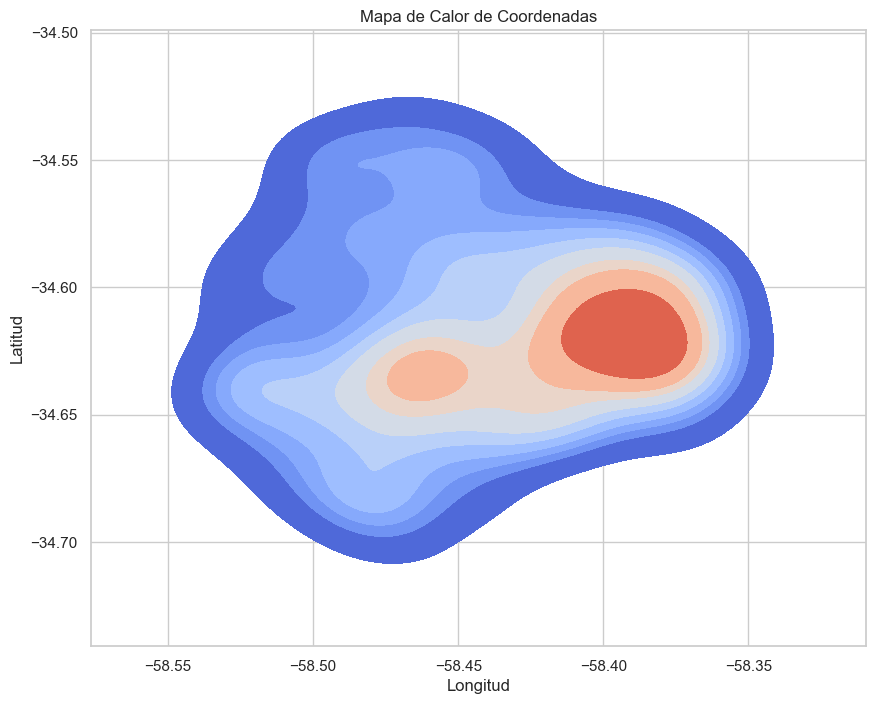

In [28]:
# Crear el mapa de calor
plt.figure(figsize=(10, 8))
sns.kdeplot(data=hechos_cop, x='pos x', y='pos y', cmap='coolwarm', fill=True)
plt.title('Mapa de Calor de Coordenadas')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

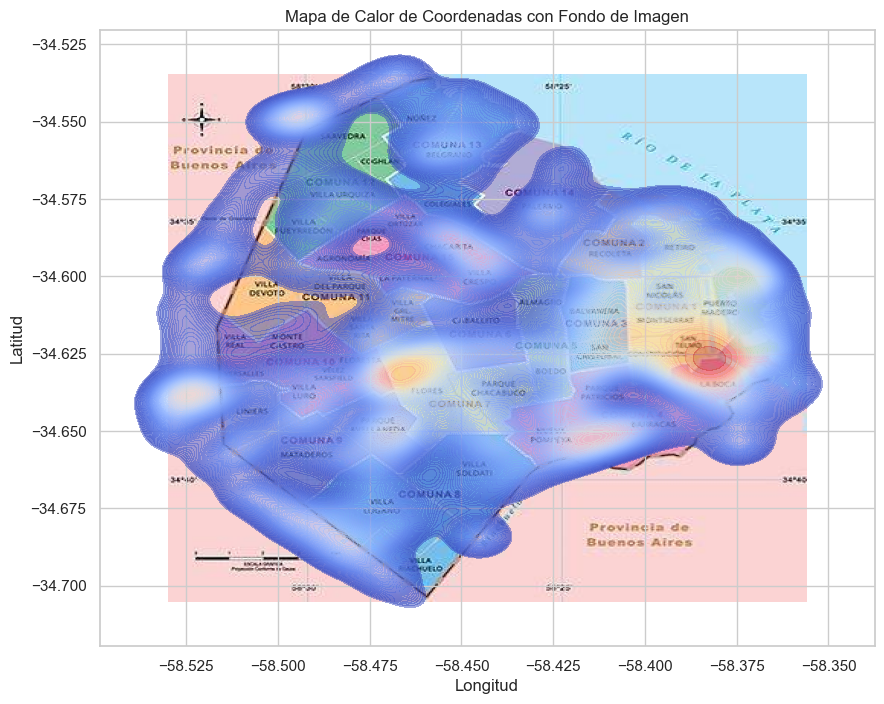

In [29]:
#importamos una imagen de fondo
img = mpimg.imread('C:\\Users\\licle\\Desktop\\PROYECTO INDIVIDUAL N°2\\mapa caba.jpeg')

# Configurar el gráfico
plt.figure(figsize=(10, 8))
plt.imshow(img, extent=[hechos_cop['pos x'].min(), hechos_cop['pos x'].max(), hechos_cop['pos y'].min(), hechos_cop['pos y'].max()], aspect='auto')

# Crear el mapa de calor superpuesto a la imagen
sns.kdeplot(data=hechos_cop, x='pos x', y='pos y', cmap='coolwarm', fill=True, alpha=0.5, bw_adjust=0.4, levels=100)

# Ajustar el título y etiquetas
plt.title('Mapa de Calor de Coordenadas con Fondo de Imagen')
plt.xlabel('Longitud')
plt.ylabel('Latitud')

# Mostrar el gráfico
plt.show()

In [32]:
# Obtenemos las 50 calles más frecuentes
calles_mas_frecuentes = hechos['CALLE'].value_counts().nlargest(50).index.tolist()

# Seleccionar solo las filas correspondientes a las 50 calles más frecuentes
hechos_filtrados = hechos[hechos['CALLE'].isin(calles_mas_frecuentes)]
hechos_filtrados = hechos_filtrados.head(50)

#Exportamos un csv para conseguir un gráfico por zonas con ayuda de GPS Visualizer y comparamos con el mapa de calor
datos = dict(latitude=hechos_filtrados["pos y"], longitude = hechos_filtrados["pos x"], lugar=hechos_filtrados["CALLE"], label=hechos_filtrados['ID'])
pd.DataFrame(datos).to_csv('ZonasHechos.csv', index=False)

* Gráfico GPS visualizer:

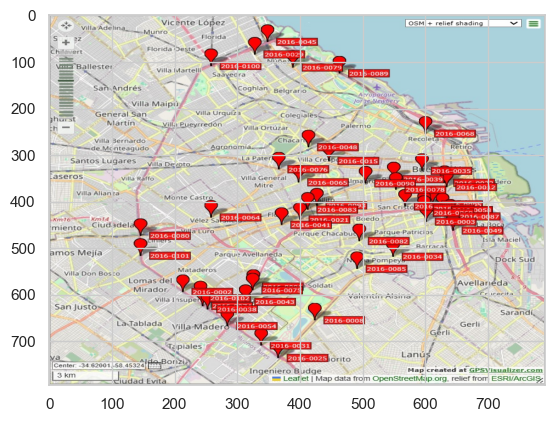

In [33]:
img2 = mpimg.imread('C:\\Users\\licle\\Desktop\\PROYECTO INDIVIDUAL N°2\\GPS Visualizer mapa caba.jpg')
plt.imshow(img2, aspect='auto')

## Conclusiones

* Podemos notar contrastando imagen y mapa de calor que hay cierta frecuencia y tendencia de lugares puntuales en zonas de la Ciudad de Buenos Aires en las que ocurren los accidentes de tránsito: 
    * Comuna 1 y 4: comunas que están contiguas, la comuna 1 es conocida como "Microcentro" que tiene cierta coherencia con el análisis general dado a que "Microcentro" se caracteriza por alta frecuencia y concentración de tráfico constantemente. La comuna 4 está continua a la comuna 1 y tiene varias arterías fundamentales de la ciudad como Av. 25 de Mayo y circunda con la Zona Sur del AMBA, siendo un camino frecuentado para la entrada y salida a "Microcentro". 
    * Comuna 9: la zona de Parque Avellaneda, Liniers y Matadero. Liniers se conoce por ser un punto neuralgico en el funcionamiento de carreteras, conecta Autopistas, Rutas y Avenidas que conectan las 4 zonas (sur, norte, este y oeste) de la Ciudad y el Gran Buenos Aires.
    * Av. Gral Paz: notamos que la extensión de la avenida general paz es grande y que cuenta con bastante concurrecia, conectando varios puntos importantes de la Ciudad y alrededores.

Para concluir el EDA usaremos la librería YDATA Profiling si bien el proceso es automatizado recurriremos a YDATA Profiling para comparar nuestros análisis con el de la librería para revisar nuestra lectura manual con una lectura más automatizada y contrastar datos:

In [158]:
ProfileReport(victimas)

Render HTML: 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]


In [159]:
ProfileReport(hechos)

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


# Resumen

* Hemos ahondado en las investigación de las variables de los DataSets Propuesto, tenemos conclusiones separadas por ejes temáticos. Al integralos encontramos correlaciones entre variables como por ejemplo SEXO y EDAD, comparaciones de números de victimas y temporalidades y las localizaciones de los hechos. Para la etapa de visualización y KPI´s ya tenemos anotaciones de puntos críticos para darle solución a los problemas que se nos propone. Ahora exportaremos el corpus con el que venimos trabajando para continuar con la visualización (POWER BI) y respuestas específicas a los KPI´s que se plantean.
* De nuestro EDA proponemos que un Índicado Clave de Rendimiento serán propuestas para bajar el índice de accidentes según zonas concretas de la Ciudad Autonoma de Buenos Aires para una población determinadad (varones entre 25 y 45 años).

In [34]:
#Exportamos los archivos
hechos.to_csv("Hechos_DEF.csv", index=False)
victimas.to_csv("Victimas_DEF.csv", index=False)